Student folders in MISA path: ['poorav', 'aditya', 'fareya', 'orit']
Contents of out5940586-4294967294.out successfully read
Contents of out5940600-4294967294.out successfully read
Contents of out5940592-4294967294.out successfully read
Contents of out5940615-4294967294.out successfully read
Contents of out5940619-4294967294.out successfully read
Contents of out5940622-4294967294.out successfully read
Contents of out5940628-4294967294.out successfully read
Student folder /poorav successfully read
Contents of out5940587-4294967294.out successfully read
Contents of out5940591-4294967294.out successfully read
Contents of out5940597-4294967294.out successfully read
Contents of out5940584-4294967294.out successfully read
Contents of out5940602-4294967294.out successfully read
Contents of out5940604-4294967294.out successfully read
Student folder /aditya successfully read
Contents of out5940583-4294967294.out successfully read
Contents of out5940618-4294967294.out successfully read
Contents 

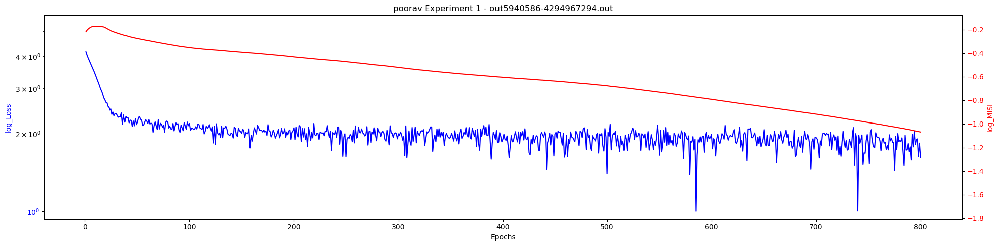

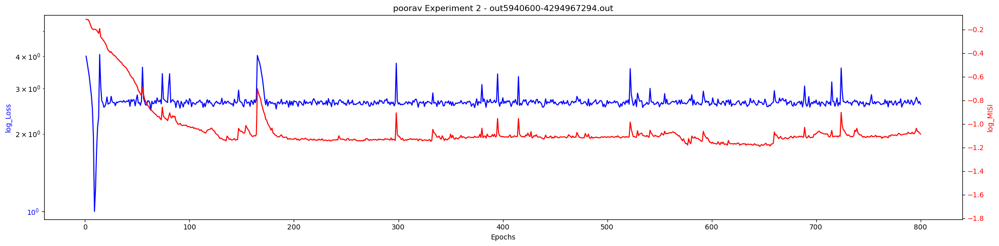

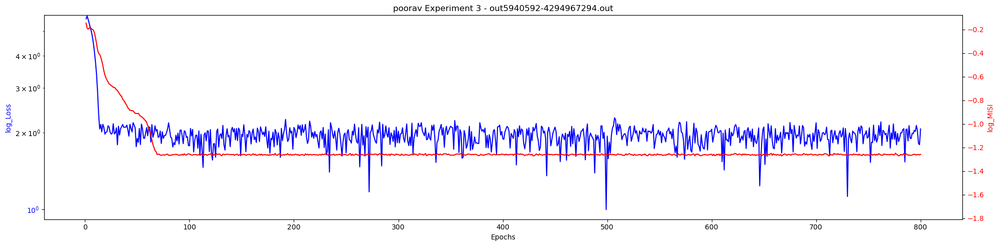

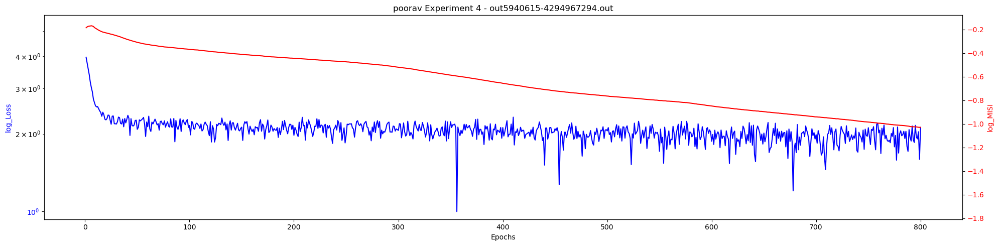

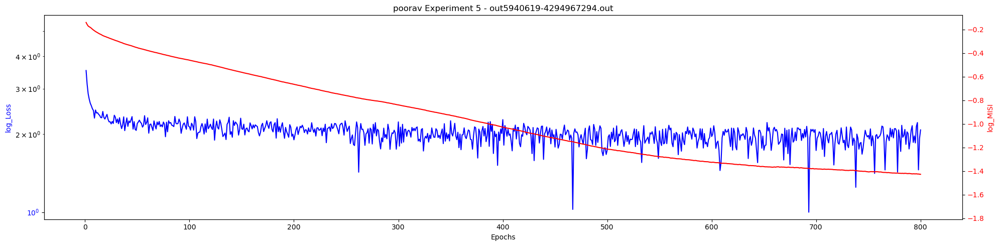

...

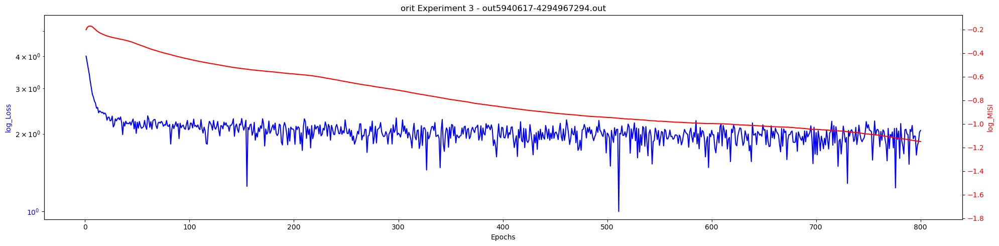

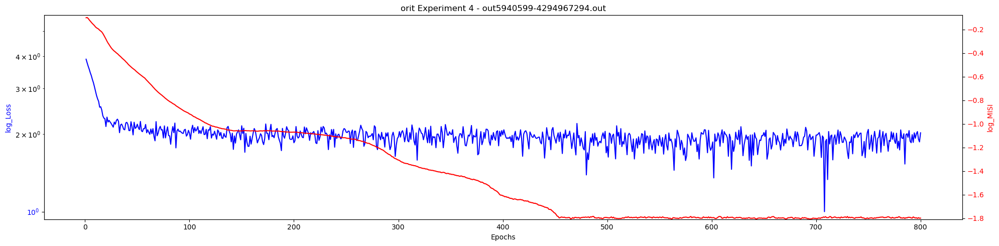

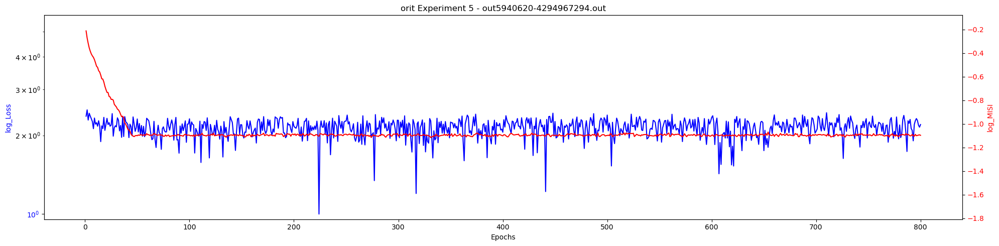

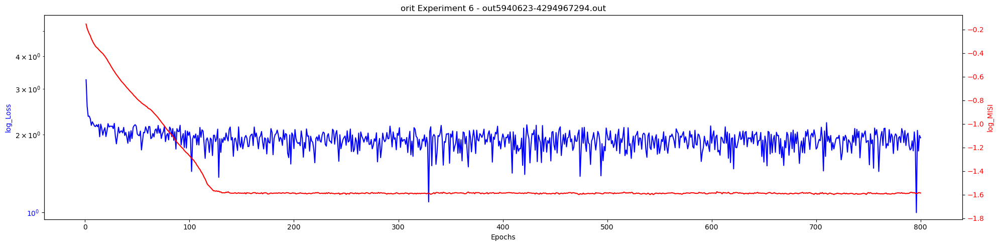

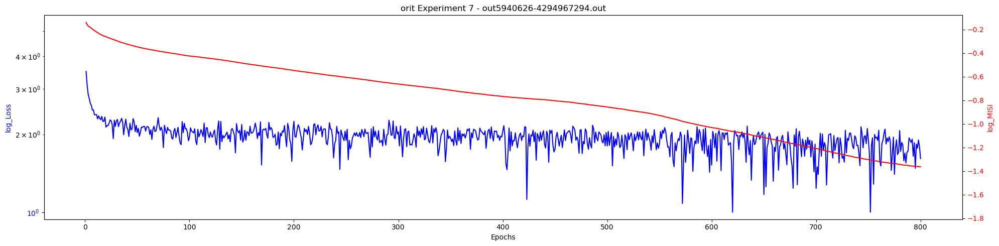

In [4]:
import os
from IPython import extract_module_locals;
this_file = extract_module_locals()[1]["__vsc_ipynb_file__"]
current_folder = os.path.dirname(this_file)

# SEED 7
import os
import pandas as pd
import re
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
misa_path = os.path.join(current_folder, 'training_results/Seed7')

student_folders = os.listdir(misa_path)
print("Student folders in MISA path:", student_folders)

all_experiments = {}
for student_name in student_folders:
  file_path = os.path.join(misa_path, student_name)
  filenames = os.listdir(file_path)
  student_experiments = []
  for files in filenames:
    filename_path = os.path.join(file_path, files)
    epochs, losses, misis = [], [], []
    with open(filename_path, 'r') as file:
      for line in file:
        match = re.search(r'epoch: (\d+)\s+loss: ([\d.]+)\s+MISI: ([\d.]+)', line)
        if match:
          epoch = int(match.group(1))
          loss = float(match.group(2))
          misi = float(match.group(3))
          epochs.append(epoch)
          losses.append(loss)
          misis.append(misi)
      student_experiments.append(pd.DataFrame({
        'epoch': epochs,
        'loss': losses,
        'misi': misis,
        'log_loss': np.log10(losses),
        'log_misi': np.log10(misis)}))
    print(f"Contents of {files} successfully read")
  print(f'Student folder /{student_name} successfully read')
  all_experiments[f'{student_name}'] = student_experiments
# print(all_experiments)

# CREATE LOSS - SEED 7
total_max_loss = -float('inf')
total_min_loss = float('inf')
total_max_misi = -float('inf')
total_min_misi = float('inf')
for student in all_experiments:
  for experiment in all_experiments[student]:
    max_loss = experiment['loss'].max()
    min_loss = experiment['loss'].min()
    print(f"  DataFrame: Max loss = {max_loss}, Min loss = {min_loss}")
    range = max_loss - min_loss
    max_misi = experiment['log_misi'].max()
    min_misi = experiment['log_misi'].min()
    print(f"  DataFrame: Max misi = {max_misi}, Min misi = {min_misi}")
    if max_loss > total_max_loss:
      total_max_loss = max_loss
    if min_loss < total_min_loss:
      total_min_loss = min_loss
    if max_misi > total_max_misi:
      total_max_misi = max_misi
    if min_misi < total_min_misi:
      total_min_misi = min_misi

for student in all_experiments:
  file_path = os.path.join(misa_path, student)
  filenames = os.listdir(file_path)
  count = 1
  for ix, experiment in enumerate(all_experiments[student]):
    # sns.relplot(
    # data=experiment,
    # x="epoch", y="loss",
    # hue="misi").fig.suptitle(f'{student} Experiment {count}', fontsize=14)  # Workaround for single title
    # sns.relplot(
    # data=experiment,
    # x="epoch", y="misi",
    # hue="loss").fig.suptitle(f'{student} Experiment {count}', fontsize=14)  # Workaround for single title

    # sns.scatterplot(x=experiment['epoch'], y=experiment['loss'], color='blue', label='Loss Values')
    # sns.scatterplot(x=experiment['epoch'], y=experiment['misi'], color='red', label='MISI Values')
    # plt.xlabel('Epochs')
    # plt.ylabel('MISI Values')
    # plt.title(f'{student} Experiment {count}')
    # plt.show()

    fig, ax1 = plt.subplots(1, 1, figsize=(20,5))
    # ax1.scatter(experiment['epoch'], np.log10(experiment['loss'] - experiment['loss'].min() + 1) + 1, color='blue', label='Loss Values', s=2)
    ax1.plot(experiment['epoch'], np.log10(experiment['loss'] - experiment['loss'].min() + 1) + 1, color='blue', label='Loss Values')

    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('log_Loss', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    # change axis 1 to log scale:
    ax1.set_yscale('log')
    ax1.set_ylim(None, np.log10(total_max_loss - experiment['loss'].min() + 1) + 1)

    ax2 = ax1.twinx()
    # ax2.scatter(experiment['epoch'], experiment['log_misi'], color='red', label='MISI Values', s=2)
    ax2.plot(experiment['epoch'], experiment['log_misi'], color='red', label='MISI Values')

    ax2.set_ylabel('log_MISI', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.set_ylim(total_min_misi, total_max_misi)

    # plt.xlabel('Epochs'
    plt.title(f'{student} Experiment {count} - {filenames[ix]}')
    fig.tight_layout()
    # Adjust axis limits to be from 0 to highest value - minimum for loss.
    plt.show()
    count += 1

  #Grab lowest and highest loss, subtract value when plotting and add 1.
  #Grab lowest and highest misi and scale every plot identically


Student folders in MISA path: ['orit']
Contents of out7392873-4294967294.out successfully read
Contents of out7397557-4294967294.out successfully read
Contents of out7398934-4294967294.out successfully read
Contents of out7392738-4294967294.out successfully read
Contents of out7397868-4294967294.out successfully read
Contents of out7398925-4294967294.out successfully read
Contents of out7399286-4294967294.out successfully read
Contents of out7399752-4294967294.out successfully read
Contents of out7399967-4294967294.out successfully read
Contents of out7399970-4294967294.out successfully read
Contents of out7402021-4294967294.out successfully read
Contents of out7402031-4294967294.out successfully read
Contents of out7402032-4294967294.out successfully read
Contents of out7402033-4294967294.out successfully read
Contents of out7402034-4294967294.out successfully read
Contents of out7472487-4294967294.out successfully read
Contents of out7472495-4294967294.out successfully read
Contents 

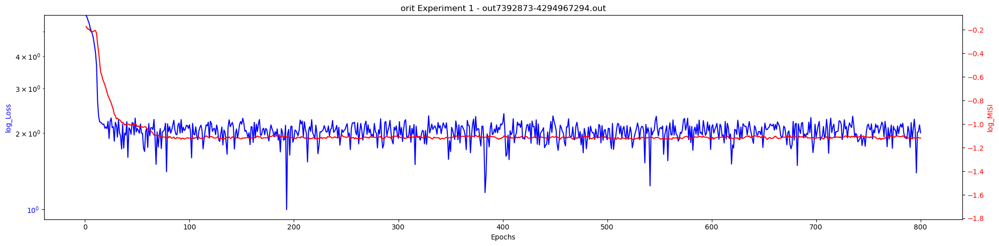

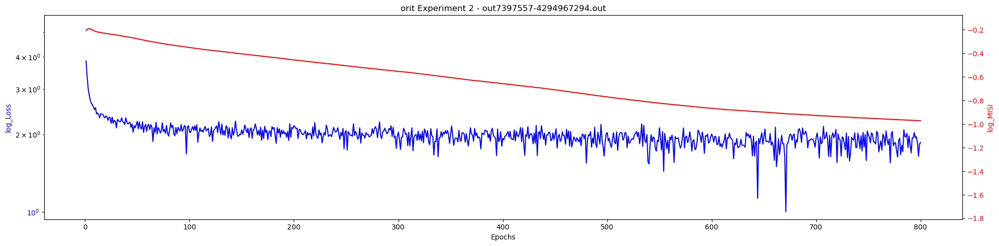

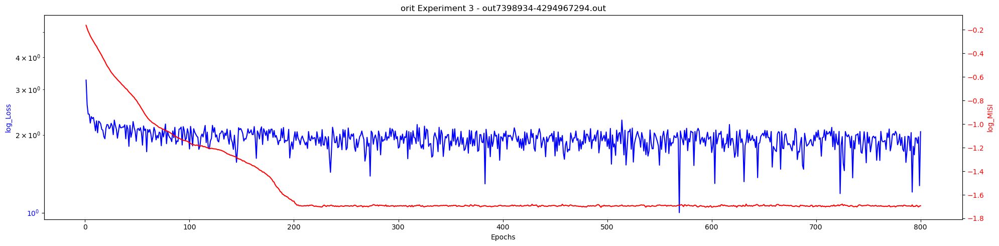

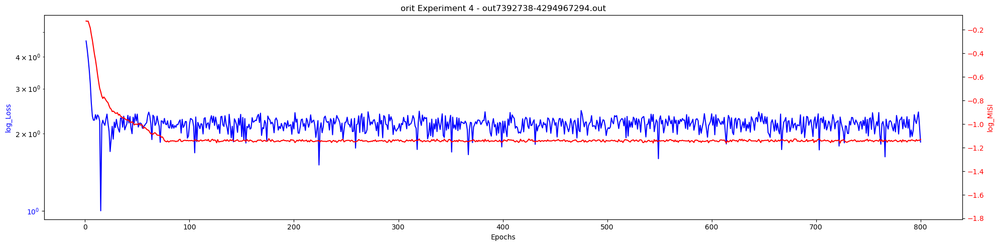

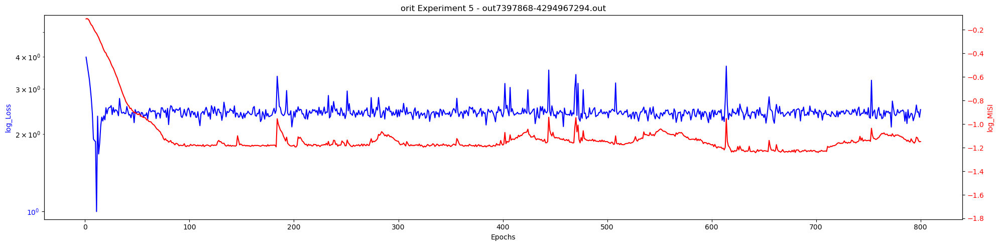

...

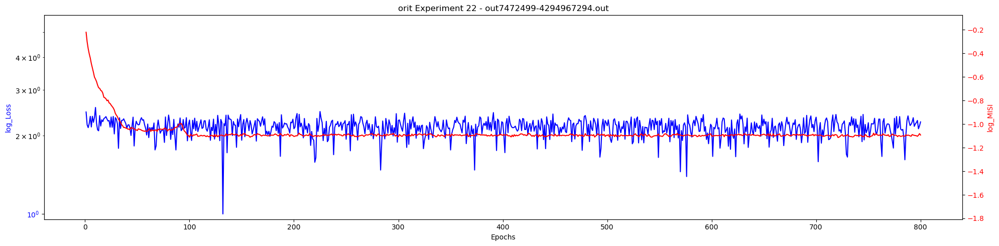

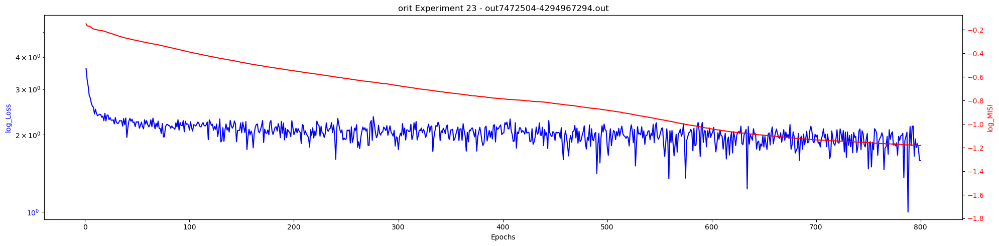

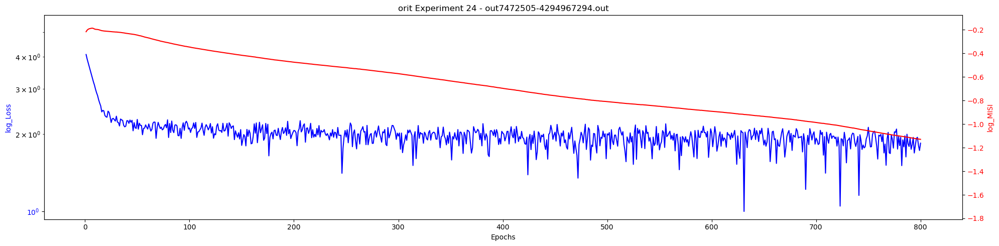

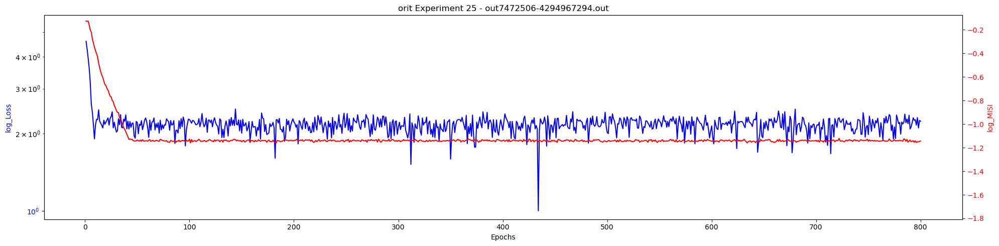

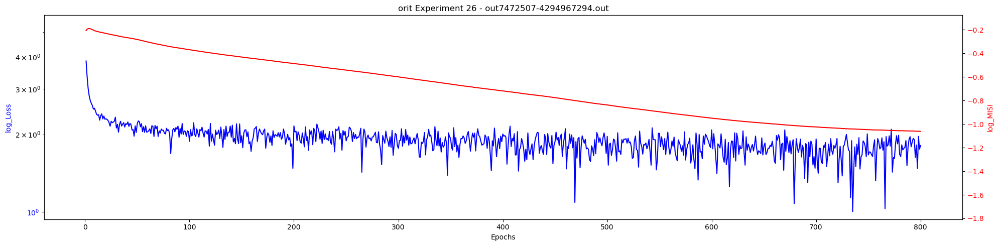

In [2]:
import os
from IPython import extract_module_locals;
this_file = extract_module_locals()[1]["__vsc_ipynb_file__"]
current_folder = os.path.dirname(this_file)

# SEED 14
import os
import pandas as pd
import re
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
misa_path = os.path.join(current_folder, 'training_results/Seed14')

student_folders = os.listdir(misa_path)
print("Student folders in MISA path:", student_folders)

all_experiments = {}
for student_name in student_folders:
  file_path = os.path.join(misa_path, student_name)
  filenames = os.listdir(file_path)
  student_experiments = []
  for files in filenames:
    filename_path = os.path.join(file_path, files)
    epochs, losses, misis = [], [], []
    with open(filename_path, 'r') as file:
      for line in file:
        match = re.search(r'epoch: (\d+)\s+loss: ([\d.]+)\s+MISI: ([\d.]+)', line)
        if match:
          epoch = int(match.group(1))
          loss = float(match.group(2))
          misi = float(match.group(3))
          epochs.append(epoch)
          losses.append(loss)
          misis.append(misi)
      student_experiments.append(pd.DataFrame({
        'epoch': epochs,
        'loss': losses,
        'misi': misis,
        'log_loss': np.log10(losses),
        'log_misi': np.log10(misis)}))
    print(f"Contents of {files} successfully read")
  print(f'Student folder /{student_name} successfully read')
  all_experiments[f'{student_name}'] = student_experiments
# print(all_experiments)

# CREATE LOSS - SEED 14
total_max_loss = -float('inf')
total_min_loss = float('inf')
total_max_misi = -float('inf')
total_min_misi = float('inf')
for student in all_experiments:
  for experiment in all_experiments[student]:
    max_loss = experiment['loss'].max()
    min_loss = experiment['loss'].min()
    print(f"  DataFrame: Max loss = {max_loss}, Min loss = {min_loss}")
    range = max_loss - min_loss
    max_misi = experiment['log_misi'].max()
    min_misi = experiment['log_misi'].min()
    print(f"  DataFrame: Max misi = {max_misi}, Min misi = {min_misi}")
    if max_loss > total_max_loss:
      total_max_loss = max_loss
    if min_loss < total_min_loss:
      total_min_loss = min_loss
    if max_misi > total_max_misi:
      total_max_misi = max_misi
    if min_misi < total_min_misi:
      total_min_misi = min_misi

for student in all_experiments:
  file_path = os.path.join(misa_path, student)
  filenames = os.listdir(file_path)
  count = 1
  for ix, experiment in enumerate(all_experiments[student]):
    # sns.relplot(
    # data=experiment,
    # x="epoch", y="loss",
    # hue="misi").fig.suptitle(f'{student} Experiment {count}', fontsize=14)  # Workaround for single title
    # sns.relplot(
    # data=experiment,
    # x="epoch", y="misi",
    # hue="loss").fig.suptitle(f'{student} Experiment {count}', fontsize=14)  # Workaround for single title

    # sns.scatterplot(x=experiment['epoch'], y=experiment['loss'], color='blue', label='Loss Values')
    # sns.scatterplot(x=experiment['epoch'], y=experiment['misi'], color='red', label='MISI Values')
    # plt.xlabel('Epochs')
    # plt.ylabel('MISI Values')
    # plt.title(f'{student} Experiment {count}')
    # plt.show()

    fig, ax1 = plt.subplots(1, 1, figsize=(20,5))
    # ax1.scatter(experiment['epoch'], np.log10(experiment['loss'] - experiment['loss'].min() + 1) + 1, color='blue', label='Loss Values', s=2)
    ax1.plot(experiment['epoch'], np.log10(experiment['loss'] - experiment['loss'].min() + 1) + 1, color='blue', label='Loss Values')

    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('log_Loss', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    # change axis 1 to log scale:
    ax1.set_yscale('log')
    ax1.set_ylim(None, np.log10(total_max_loss - experiment['loss'].min() + 1) + 1)

    ax2 = ax1.twinx()
    # ax2.scatter(experiment['epoch'], experiment['log_misi'], color='red', label='MISI Values', s=2)
    ax2.plot(experiment['epoch'], experiment['log_misi'], color='red', label='MISI Values')

    ax2.set_ylabel('log_MISI', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.set_ylim(total_min_misi, total_max_misi)

    # plt.xlabel('Epochs'
    plt.title(f'{student} Experiment {count} - {filenames[ix]}')
    fig.tight_layout()
    # Adjust axis limits to be from 0 to highest value - minimum for loss.
    plt.show()
    count += 1

  #Grab lowest and highest loss, subtract value when plotting and add 1.
  #Grab lowest and highest misi and scale every plot identically

Student folders in MISA path: ['Seed21_V2']
Contents of out7537956-4294967294.out successfully read
Contents of out7537955-4294967294.out successfully read
Contents of out7537958-4294967294.out successfully read
Contents of out7537961-4294967294.out successfully read
Contents of out7537967-4294967294.out successfully read
Contents of out7537968-4294967294.out successfully read
Contents of out7537971-4294967294.out successfully read
Contents of out7537974-4294967294.out successfully read
Contents of out7537972-4294967294.out successfully read
Contents of out7537979-4294967294.out successfully read
Contents of out7537983-4294967294.out successfully read
Contents of out7537984-4294967294.out successfully read
Contents of out7541719-4294967294.out successfully read
Contents of out7541722-4294967294.out successfully read
Contents of out7541724-4294967294.out successfully read
Contents of out7541727-4294967294.out successfully read
Contents of out7541731-4294967294.out successfully read
Cont

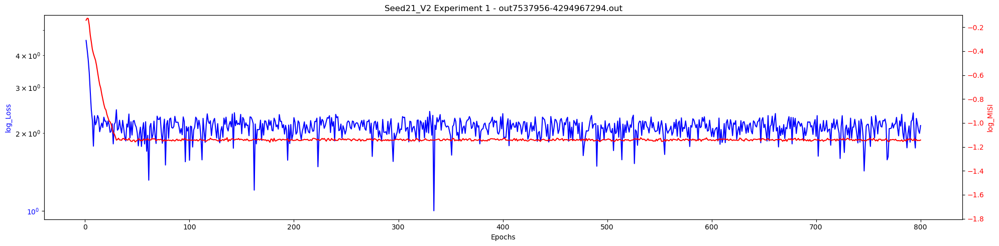

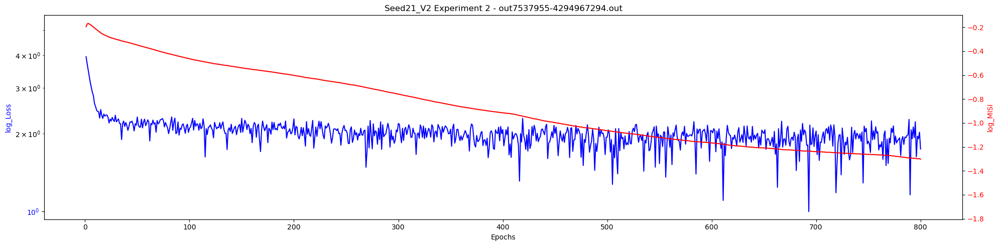

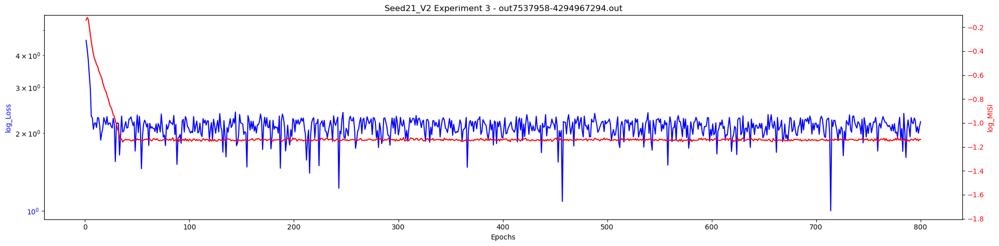

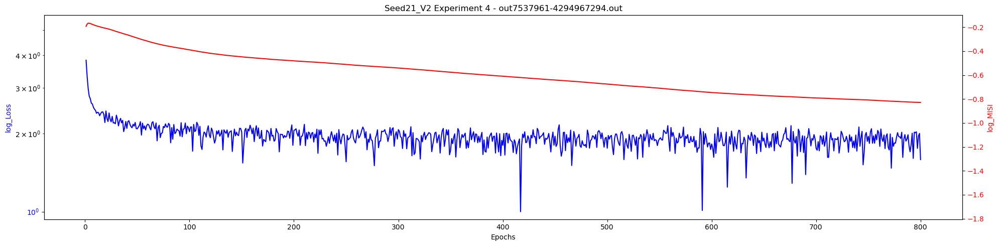

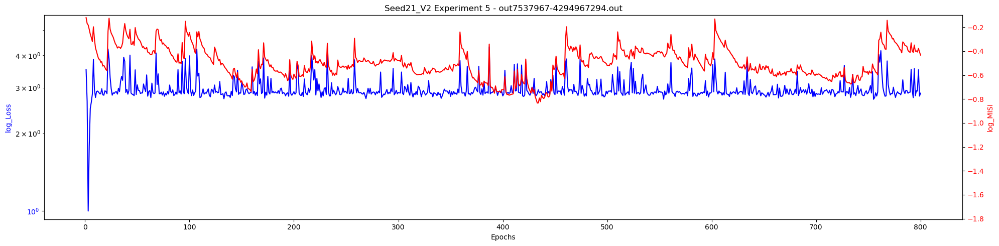

...

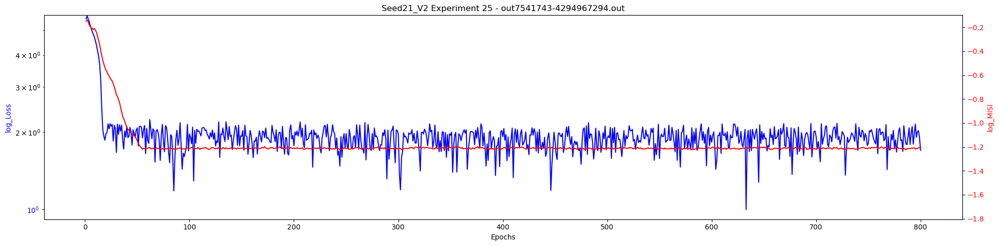

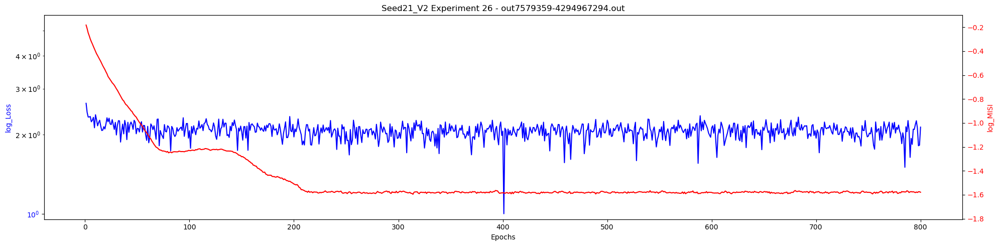

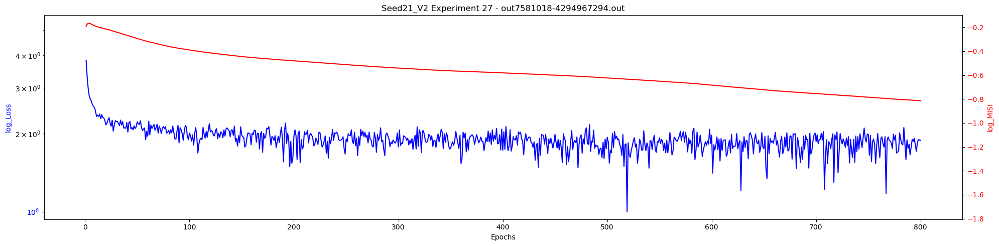

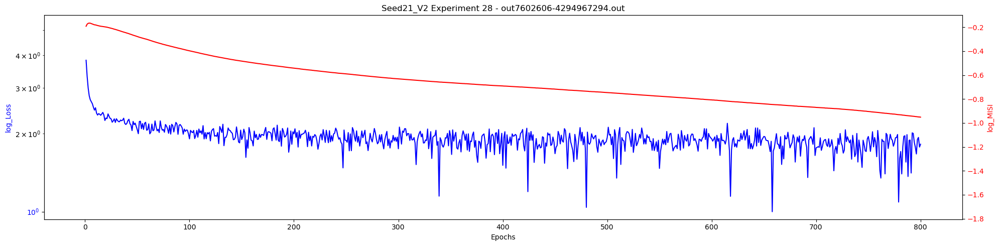

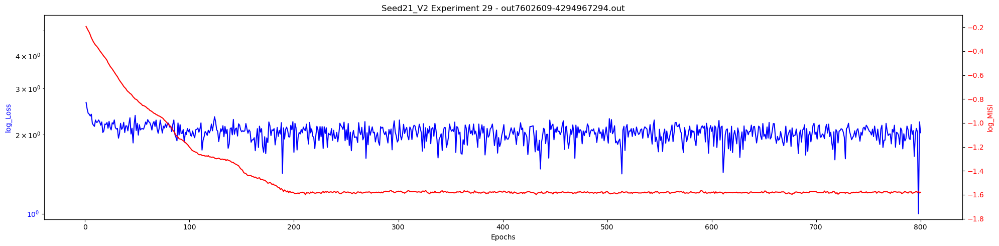

In [3]:
import os
from IPython import extract_module_locals;
this_file = extract_module_locals()[1]["__vsc_ipynb_file__"]
current_folder = os.path.dirname(this_file)

# SEED 21
import os
import pandas as pd
import re
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
misa_path = os.path.join(current_folder, 'training_results/Seed21')

student_folders = os.listdir(misa_path)
print("Student folders in MISA path:", student_folders)

all_experiments = {}
for student_name in student_folders:
  file_path = os.path.join(misa_path, student_name)
  filenames = os.listdir(file_path)
  student_experiments = []
  for files in filenames:
    filename_path = os.path.join(file_path, files)
    epochs, losses, misis = [], [], []
    with open(filename_path, 'r') as file:
      for line in file:
        match = re.search(r'epoch: (\d+)\s+loss: ([\d.]+)\s+MISI: ([\d.]+)', line)
        if match:
          epoch = int(match.group(1))
          loss = float(match.group(2))
          misi = float(match.group(3))
          epochs.append(epoch)
          losses.append(loss)
          misis.append(misi)
      student_experiments.append(pd.DataFrame({
        'epoch': epochs,
        'loss': losses,
        'misi': misis,
        'log_loss': np.log10(losses),
        'log_misi': np.log10(misis)}))
    print(f"Contents of {files} successfully read")
  print(f'Student folder /{student_name} successfully read')
  all_experiments[f'{student_name}'] = student_experiments
# print(all_experiments)

# CREATE LOSS - SEED 21
total_max_loss = -float('inf')
total_min_loss = float('inf')
total_max_misi = -float('inf')
total_min_misi = float('inf')
for student in all_experiments:
  for experiment in all_experiments[student]:
    max_loss = experiment['loss'].max()
    min_loss = experiment['loss'].min()
    print(f"  DataFrame: Max loss = {max_loss}, Min loss = {min_loss}")
    range = max_loss - min_loss
    max_misi = experiment['log_misi'].max()
    min_misi = experiment['log_misi'].min()
    print(f"  DataFrame: Max misi = {max_misi}, Min misi = {min_misi}")
    if max_loss > total_max_loss:
      total_max_loss = max_loss
    if min_loss < total_min_loss:
      total_min_loss = min_loss
    if max_misi > total_max_misi:
      total_max_misi = max_misi
    if min_misi < total_min_misi:
      total_min_misi = min_misi

for student in all_experiments:
  file_path = os.path.join(misa_path, student)
  filenames = os.listdir(file_path)
  count = 1
  for ix, experiment in enumerate(all_experiments[student]):
    # sns.relplot(
    # data=experiment,
    # x="epoch", y="loss",
    # hue="misi").fig.suptitle(f'{student} Experiment {count}', fontsize=14)  # Workaround for single title
    # sns.relplot(
    # data=experiment,
    # x="epoch", y="misi",
    # hue="loss").fig.suptitle(f'{student} Experiment {count}', fontsize=14)  # Workaround for single title

    # sns.scatterplot(x=experiment['epoch'], y=experiment['loss'], color='blue', label='Loss Values')
    # sns.scatterplot(x=experiment['epoch'], y=experiment['misi'], color='red', label='MISI Values')
    # plt.xlabel('Epochs')
    # plt.ylabel('MISI Values')
    # plt.title(f'{student} Experiment {count}')
    # plt.show()

    fig, ax1 = plt.subplots(1, 1, figsize=(20,5))
    # ax1.scatter(experiment['epoch'], np.log10(experiment['loss'] - experiment['loss'].min() + 1) + 1, color='blue', label='Loss Values', s=2)
    ax1.plot(experiment['epoch'], np.log10(experiment['loss'] - experiment['loss'].min() + 1) + 1, color='blue', label='Loss Values')

    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('log_Loss', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    # change axis 1 to log scale:
    ax1.set_yscale('log')
    ax1.set_ylim(None, np.log10(total_max_loss - experiment['loss'].min() + 1) + 1)

    ax2 = ax1.twinx()
    # ax2.scatter(experiment['epoch'], experiment['log_misi'], color='red', label='MISI Values', s=2)
    ax2.plot(experiment['epoch'], experiment['log_misi'], color='red', label='MISI Values')

    ax2.set_ylabel('log_MISI', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.set_ylim(total_min_misi, total_max_misi)

    # plt.xlabel('Epochs'
    plt.title(f'{student} Experiment {count} - {filenames[ix]}')
    fig.tight_layout()
    # Adjust axis limits to be from 0 to highest value - minimum for loss.
    plt.show()
    count += 1

  #Grab lowest and highest loss, subtract value when plotting and add 1.
  #Grab lowest and highest misi and scale every plot identically